# Data Science Blog Post
## Comparison of the most popular programming languages accross USA, Europe and India

In this project, I am exploring the Stack Overflow data from 2017 to better understand:
- Which among the USA & Canada, Europe and India is a better place to pursue interest in the field of computer science as a professional and also pursue higher studies as a student.
- The salary differences among these regions.
- The most popular programming languages across these regions.
- The most demanded programming languages across these regions.

In [1]:
import numpy as np
import pandas as pd 
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

pd.pandas.set_option('display.max_columns', None) #display all columns 
pd.pandas.set_option('display.max_rows', None)#display all rows

In [2]:
#read in the data
df_2017 = pd.read_csv('../data/2017_stack.csv')

In [3]:
df_2017.head()

,Respondent,Professional,ProgramHobby,Country,University,EmploymentStatus,FormalEducation,MajorUndergrad,HomeRemote,CompanySize,CompanyType,YearsProgram,YearsCodedJob,YearsCodedJobPast,DeveloperType,WebDeveloperType,MobileDeveloperType,NonDeveloperType,CareerSatisfaction,JobSatisfaction,ExCoderReturn,ExCoderNotForMe,ExCoderBalance,ExCoder10Years,ExCoderBelonged,ExCoderSkills,ExCoderWillNotCode,ExCoderActive,PronounceGIF,ProblemSolving,BuildingThings,LearningNewTech,BoringDetails,JobSecurity,DiversityImportant,AnnoyingUI,FriendsDevelopers,RightWrongWay,UnderstandComputers,SeriousWork,InvestTimeTools,WorkPayCare,KinshipDevelopers,ChallengeMyself,CompetePeers,ChangeWorld,JobSeekingStatus,HoursPerWeek,LastNewJob,AssessJobIndustry,AssessJobRole,AssessJobExp,AssessJobDept,AssessJobTech,AssessJobProjects,AssessJobCompensation,AssessJobOffice,AssessJobCommute,AssessJobRemote,AssessJobLeaders,AssessJobProfDevel,AssessJobDiversity,AssessJobProduct,AssessJobFinances,ImportantBenefits,ClickyKeys,JobProfile,ResumePrompted,LearnedHiring,ImportantHiringAlgorithms,ImportantHiringTechExp,ImportantHiringCommunication,ImportantHiringOpenSource,ImportantHiringPMExp,ImportantHiringCompanies,ImportantHiringTitles,ImportantHiringEducation,ImportantHiringRep,ImportantHiringGettingThingsDone,Currency,Overpaid,TabsSpaces,EducationImportant,EducationTypes,SelfTaughtTypes,TimeAfterBootcamp,CousinEducation,WorkStart,HaveWorkedLanguage,WantWorkLanguage,HaveWorkedFramework,WantWorkFramework,HaveWorkedDatabase,WantWorkDatabase,HaveWorkedPlatform,WantWorkPlatform,IDE,AuditoryEnvironment,Methodology,VersionControl,CheckInCode,ShipIt,OtherPeoplesCode,ProjectManagement,EnjoyDebugging,InTheZone,DifficultCommunication,CollaborateRemote,MetricAssess,EquipmentSatisfiedMonitors,EquipmentSatisfiedCPU,EquipmentSatisfiedRAM,EquipmentSatisfiedStorage,EquipmentSatisfiedRW,InfluenceInternet,InfluenceWorkstation,InfluenceHardware,InfluenceServers,InfluenceTechStack,InfluenceDeptTech,InfluenceVizTools,InfluenceDatabase,InfluenceCloud,InfluenceConsultants,InfluenceRecruitment,InfluenceCommunication,StackOverflowDescribes,StackOverflowSatisfaction,StackOverflowDevices,StackOverflowFoundAnswer,StackOverflowCopiedCode,StackOverflowJobListing,StackOverflowCompanyPage,StackOverflowJobSearch,StackOverflowNewQuestion,StackOverflowAnswer,StackOverflowMetaChat,StackOverflowAdsRelevant,StackOverflowAdsDistracting,StackOverflowModeration,StackOverflowCommunity,StackOverflowHelpful,StackOverflowBetter,StackOverflowWhatDo,StackOverflowMakeMoney,Gender,HighestEducationParents,Race,SurveyLong,QuestionsInteresting,QuestionsConfusing,InterestedAnswers,Salary,ExpectedSalary
0,1,Student,"Yes, both",United States,No,"Not employed, and not looking for work",Secondary school,NaN,NaN,NaN,NaN,2 to 3 years,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"With a soft ""g,"" like ""jiff""",Strongly agree,Strongly agree,Agree,Disagree,Strongly agree,Agree,Agree,Disagree,Somewhat agree,Disagree,Strongly agree,Strongly agree,Strongly disagree,Agree,Agree,Disagree,Agree,"I'm not actively looking, but I am open to new...",0.0,Not applicable/ never,Very important,Very important,Important,Very important,Very important,Very important,Important,Very important,Very important,Very important,Very important,Very important,Somewhat important,Not very important,Somewhat important,Stock options; Vacation/days off; Remote options,Yes,Other,NaN,NaN,Important,Important,Important,Somewhat important,Important,Not very important,Not very important,Not at all important,Somewhat important,Very important,NaN,NaN,Tabs,NaN,Online course; Open source contributions,NaN,NaN,NaN,6:00 AM,Swift,Swift,NaN,NaN,NaN,NaN,iOS,iOS,Atom; Xcode,Turn on some music,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Somewhat satisfied,Not very satisfied,Not at all satisfied,Very satisfied,Satisfied,Not very satisfied,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I have created a CV or Developer Story on Stac...,9.0,Desktop; iOS app,At leas

In [4]:
def region(df):
    '''
    Returns a dataframe with regions seperate into USA & Canada, Europe and India.
    
    Parameters:
    df: a raw data dataframe
    
    Returns:
    df: a dataframe with a new column region_specified
    
    '''
    
    usa_canada = ['United States', 'Canada']
    europe = ['Liechtenstein', 'Switzerland', 
           'Iceland', 'Norway','Denmark', 
           'Ireland','United Kingdom', 'Germany', 
           'Netherlands', 'Sweden', 'Luxembourg', 'Austria', 
           'Finland', 'France', 'Belgium', 'Spain', 'Italy',
           'Poland','Portugal']

    india = ['India']
    
    #Add a new catagory seperating to western and eastern
    df['region_specified'] = df['Country'].apply(lambda x: 'usa_canada' 
                                                 if x in usa_canada else ('europe' if x in europe 
                                                                          else ('india' if x in india 
                                                                                else 'other')))
    
    return df

In [5]:
def create_df(df):
    '''
    Return a df with only the necessary columns.
    
    Parameters:
    df: a raw data dataframe
    
    Returns:
    queries_df: a filtered dataframe with only useful columns
    
    '''
    
    select_columns = ['Country', 'YearsCodedJob', 'EmploymentStatus','Salary','HaveWorkedLanguage', 'WantWorkLanguage' ,'region_specified']
    queries_df = pd.DataFrame(df.query("Professional == 'Professional developer'and \
                                       EmploymentStatus == 'Employed full-time' and (region_specified == 'europe' or region_specified == 'india' or region_specified == 'usa_canada')"))[select_columns]
    return queries_df

In [6]:
df_2017 = region(df_2017)
df_2017_new = create_df(df_2017)
df_2017_new

,Country,YearsCodedJob,EmploymentStatus,Salary,HaveWorkedLanguage,WantWorkLanguage,region_specified
2,United Kingdom,20 or more years,Employed full-time,113750.000000,Java; PHP; Python,C; Python; Rust,europe
4,Switzerland,10 to 11 years,Employed full-time,NaN,NaN,NaN,europe
7,Poland,7 to 8 years,Employed full-time,NaN,CoffeeScript; Clojure; Elixir; Erlang; Haskell...,Clojure; Elixir; Haskell; Scala,europe
11,Canada,8 to 9 years,Employed full-time,NaN,NaN,NaN,usa_canada
13,Germany,15 to 16 years,Employed full-time,NaN,Java; JavaScript; Ruby; SQL,JavaScript; Ruby; Rust; Swift,europe
14,United Kingdom,20 or more years,Employed full-time,100000.000000,Assembly; C; C++,Assembly; C; C++; Python,europe
17,United States,20 or more years,Employed full-time,130000.000000,C; Clojure; JavaScript; Matlab; Rust; SQL; Swift,Assembly; Clojure; Go; JavaScript; Rust; Swift...,usa_canada
18,United States,3 to 4 years,Employed full-time,82500.000000,NaN,NaN,usa_canada
21,United Kingdom,20 or more years,Employed full-time,NaN,C#; JavaScript; SQL,C#; R; TypeScript,europe
24,Belgium,9 to 10 years,Employed full-time,NaN,NaN,NaN,europe


In [7]:
#Compare selected indicators between the regions
compiled_df = df_2017_new.groupby(['region_specified','YearsCodedJob']).mean()
compiled_df

Salary
region_specified YearsCodedJob                  
europe           1 to 2 years       32655.926063
                 10 to 11 years     55005.604004
                 11 to 12 years     56433.646110
                 12 to 13 years     66491.920379
                 13 to 14 years     58076.597771
                 14 to 15 years     61083.505846
                 15 to 16 years     66574.505246
                 16 to 17 years     56545.244213
                 17 to 18 years     74607.726416
                 18 to 19 years     69917.056718
                 19 to 20 years     65585.414297
                 2 to 3 years       35393.722670
                 20 or more years   71548.258235
                 3 to 4 years       41565.629970
                 4 to 5 years       43922.979244
                 5 to 6 years       48044.298812
                 6 to 7 years       51243.057088
                 7 to 8 years       53066.936016
                 8 to 9 years       58143.840109
                 9 to 10 years      57841.987086
                 Less than a year   31333.542293
india            1 to 2 years        6075.597550
                 10 to 11 years     22289.985657
                 11 to 12 years     23015.605009
                 12 to 13 years     36558.508295
                 13 to 14 years     41097.734058
                 14 to 15 years     24714.921940
                 15 to 16 years     37072.382910
                 16 to 17 years     15693.500710
                 17 to 18 years              NaN
                 18 to 19 years     13213.918661
                 19 to 20 years     16150.345030
                 2 to 3 years        6984.236021
                 20 or more years   11863.162531
                 3 to 4 years       10160.622686
                 4 to 5 years       11365.459756
                 5 to 6 years       11534.464699
                 6 to 7 years       13027.659841
                 7 to 8 years       26245.865407
                 8 to 9 years       18514.617621
                 9 to 10 years      21089.833672
                 Less than a year    7758.046109
usa_canada       1 to 2 years       66048.231652
                 10 to 11 years    104600.165825
                 11 to 12 years    101134.957632
                 12 to 13 years    114439.264463
                 13 to 14 years    105899.095024
                 14 to 15 years    111082.076019
                 15 to 16 years    105973.495969
                 16 to 17 years    108566.036697
                 17 to 18 years    114903.703186
                 18 to 19 years    112476.262784
                 19 to 20 years    112985.756629
                 2 to 3 years       70528.317235
                 20 or more years  119795.904932
                 3 to 4 years       76658.906411
                 4 to 5 years       83786.303870
                 5 to 6 years       86507.483835
                 6 to 7 years       92715.948341
                 7 to 8 years       92382.892349
                 8 to 9 years       99294.652430
                 9 to 10 years      96165.524566
                 Less than a year   63031.052448

In [8]:
def decode_yearscoded(df):
    """
    Return a column with a number to specify years coded in a job year.
    
    Parameters:
    df: an input dataframe
    
    Returns:
    dataframe: a converted dataframe with YearsCodedJob column becomes a representable quantity
    
    """
    mapping_years = {'1 to 2 years' : 1, 
                '10 to 11 years' : 10, 
                '11 to 12 years' : 11, 
                '12 to 13 years' : 12,
                '13 to 14 years' : 13, 
                '14 to 15 years' : 14, 
                '15 to 16 years' : 15, 
                '16 to 17 years' : 16,
                '17 to 18 years' : 17, 
                '18 to 19 years' : 18, 
                '19 to 20 years' : 19, 
                '2 to 3 years' : 2,
                '20 or more years' : 20, 
                '3 to 4 years' : 3, 
                '4 to 5 years' : 4, 
                '5 to 6 years' : 5, 
                '6 to 7 years' : 6, 
                '7 to 8 years' : 7, 
                '8 to 9 years' : 8, 
                '9 to 10 years' : 9, 
                'Less than a year' : 0}
    
    df_decoded = df.reset_index()
    df_decoded['YearsCodedJob'] = df_decoded['YearsCodedJob'].apply(lambda x: mapping_years[x])
    df_decoded['YearsCodedJob'] = pd.to_numeric(df_decoded['YearsCodedJob'])
    
    return df_decoded

In [9]:
compiled = decode_yearscoded(compiled_df)
compiled = compiled.sort_values(by = ['region_specified','YearsCodedJob'])
#compiled.groupby('region_specified')
compiled.set_index('YearsCodedJob', inplace=True)

compiled.groupby('region_specified')['Salary']
compiled['Salary'].fillna(method = 'backfill',inplace = True)
compiled

,region_specified,Salary
YearsCodedJob,,
0,europe,31333.542293
1,europe,32655.926063
2,europe,35393.722670
3,europe,41565.629970
4,europe,43922.979244
5,europe,48044.298812
6,europe,51243.057088
7,europe,53066.936016
8,europe,58143.840109


In [10]:
lang_df = df_2017_new[['HaveWorkedLanguage', 'WantWorkLanguage','region_specified']]

lang_df_usa = lang_df[lang_df['region_specified'] == 'usa_canada']

lang_df_europe = lang_df[lang_df['region_specified'] == 'europe']

lang_df_india = lang_df[lang_df['region_specified'] == 'india']

lang_df.groupby(['region_specified'])

In [11]:
def split_cols(df, column):
    ''' Split column by ;,
        returns a splited series.
    '''
    df = df.dropna(subset=[column])
    column_series = df[column].apply(lambda x: x.split(';'))
    
    return column_series

In [12]:
lang_worked = split_cols(lang_df, 'HaveWorkedLanguage')
lang_demand = split_cols(lang_df, 'WantWorkLanguage')

lang_worked_usa = split_cols(lang_df_usa, 'HaveWorkedLanguage')
lang_demand_usa = split_cols(lang_df_usa, 'WantWorkLanguage')

lang_worked_europe = split_cols(lang_df_europe, 'HaveWorkedLanguage')
lang_demand_europe = split_cols(lang_df_europe, 'WantWorkLanguage')

lang_worked_india = split_cols(lang_df_india, 'HaveWorkedLanguage')
lang_demand_india = split_cols(lang_df_india, 'WantWorkLanguage')

In [13]:
def flatten(array_list):
    ''' 
        returns a flattened list of a nested list.
    '''
    
    objects = []
    
    for row in array_list:
        for obj in row:
            objects.append(obj.strip())
            
    return objects

lang_worked_list = flatten(lang_worked)
lang_demand_list = flatten(lang_demand)

lang_worked_list_usa = flatten(lang_worked_usa)
lang_demand_list_usa = flatten(lang_demand_usa)

lang_worked_list_europe = flatten(lang_worked_europe)
lang_demand_list_europe = flatten(lang_demand_europe)

lang_worked_list_india = flatten(lang_worked_india)
lang_demand_list_india = flatten(lang_demand_india)

In [14]:
def group_list(data_list,region_specified = 'all'):
    ''' Group by count to a list,
        returns a result dict.
    '''
    
    grouped_list = dict(Counter(data_list))
    grouped_dict = [{'Language':key, 'Count': value,'region':region_specified} for key, value in grouped_list.items()]
    
    return grouped_dict
lang_worked_dict = group_list(lang_worked_list)
lang_demand_dict = group_list(lang_demand_list)

lang_worked_dict_usa = group_list(lang_worked_list_usa,'usa_canada')
lang_demand_dict_usa = group_list(lang_demand_list_usa,'usa_canada')

lang_worked_dict_europe = group_list(lang_worked_list_europe,'europe')
lang_demand_dict_europe = group_list(lang_demand_list_europe,'europe')

lang_worked_dict_india = group_list(lang_worked_list_india,'india')
lang_demand_dict_india = group_list(lang_demand_list_india,'india')

In [15]:
def append_df(dicts):
    df1 = pd.DataFrame(dicts[0])
    df2 = pd.DataFrame(dicts[1])
    df3 = pd.DataFrame(dicts[2])
    
    df = df1.append(df2.append(df3))
    
    return df

worked_languages = append_df([lang_worked_dict_usa, lang_worked_dict_europe,lang_worked_dict_india])
demand_languages = append_df([lang_demand_dict_usa, lang_demand_dict_europe,lang_demand_dict_india])


df1 = pd.DataFrame(lang_worked_dict)
total_worked = df1.Count.sum()
df1['Percentage'] = df1['Count'].apply(lambda x : (x / total_worked) * 100)
df1 = df1.sort_values(by = 'Percentage',ascending = False).head(10)

df2 = pd.DataFrame(lang_demand_dict)
total_worked = df2.Count.sum()
df2['Percentage'] = df2['Count'].apply(lambda x : (x / total_worked) * 100)
df2 = df2.sort_values(by = 'Percentage',ascending = False).head(10)


In [16]:
def calc_percentage(df,column):
    df_copy = df
    series = []
    
    for val in df_copy[column].unique():
        series.append(df_copy[df_copy[column] == val]['Count'] / 
                      df_copy[df_copy[column] == val]['Count'].sum())
    
    joined_series = pd.Series()
    for i_series in series:
        joined_series = joined_series.append(i_series)
        
    return joined_series

worked_languages['Percentage'] = calc_percentage(worked_languages, 'region')
demand_languages['Percentage'] = calc_percentage(demand_languages, 'region')


In [17]:
top_worked = worked_languages.sort_values(by=['Percentage'], ascending=False).head(20)['Language'].unique()
top_demanded = demand_languages.sort_values(by=['Percentage'], ascending=False).head(20)['Language'].unique()

worked_lang_chart = worked_languages[worked_languages['Language'].isin(top_worked)]
demand_lang_chart = demand_languages[demand_languages['Language'].isin(top_demanded)]

# Results
## Which among the USA & Canada, Europe and India is a better place to pursue interest in the field of computer science as a professional and also pursue higher studies as a student.

Text(0, 0.5, 'Average Salary')

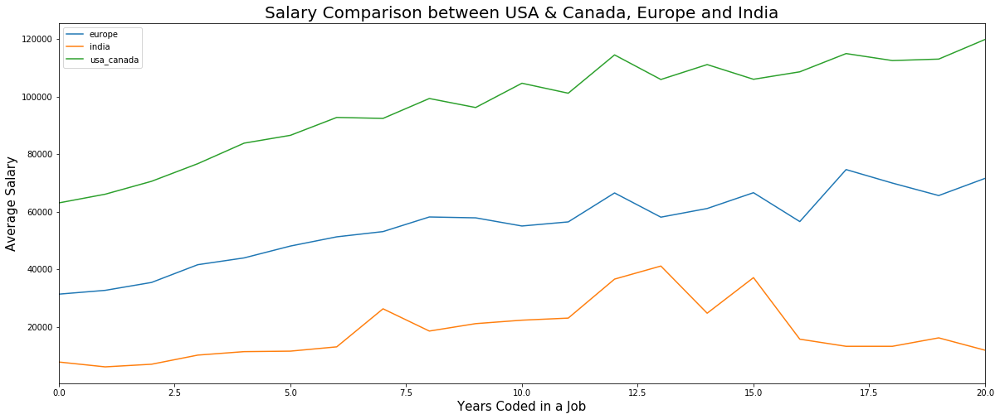

In [18]:
plt.figure(figsize=(20,8))
compiled.groupby('region_specified')['Salary'].plot(legend = True)
plt.title("Salary Comparison between USA & Canada, Europe and India",fontsize = 20);
plt.xlabel('Years Coded in a Job',fontsize = 15)
plt.ylabel('Average Salary',fontsize = 15)

## The salary differences among these regions.

In [19]:
compiled.groupby('region_specified').mean().Salary

region_specified
europe        55003.876123
india         18459.066039
usa_canada    97094.096776
Name: Salary, dtype: float64

Text(0, 0.5, 'Average Salary(USD)')

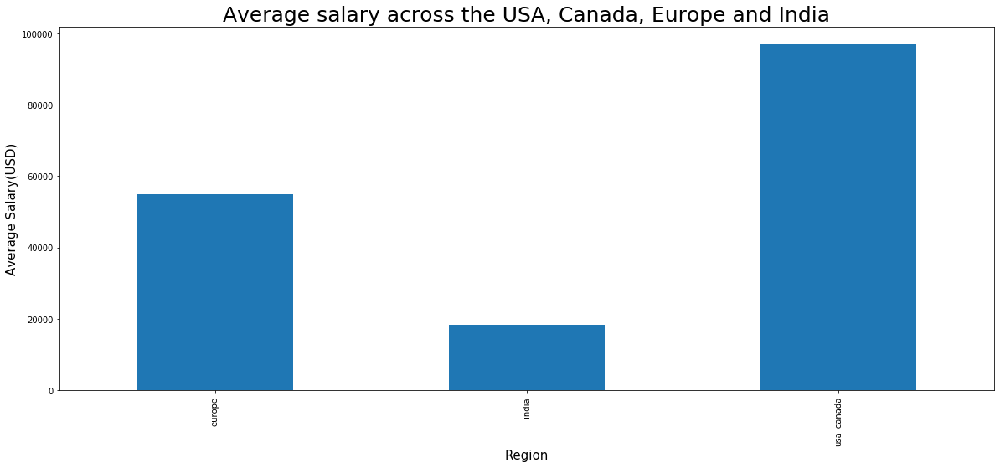

In [20]:
plt.figure(figsize=(20,8))
compiled.groupby('region_specified').mean().Salary.plot(kind = 'bar')
plt.title('Average salary across the USA, Canada, Europe and India',fontsize = 25)
plt.xlabel('Region',fontsize = 15)
plt.ylabel('Average Salary(USD)',fontsize = 15)

## The most popular programming languages across these regions.

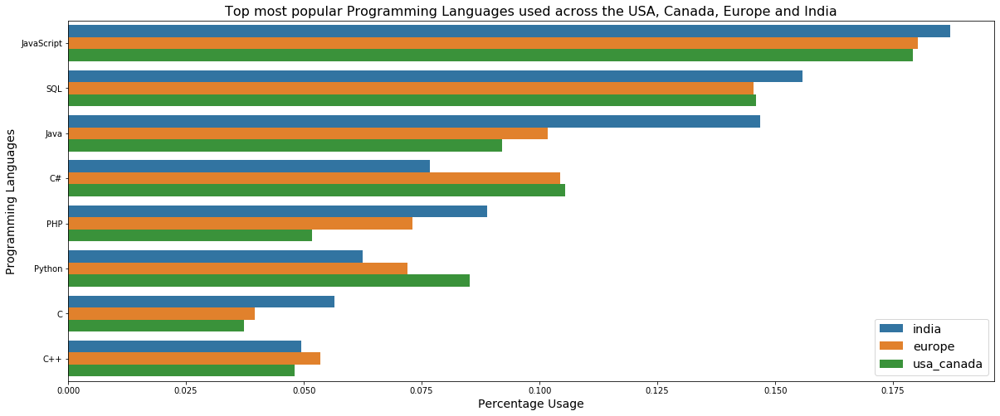

In [21]:
plt.figure(figsize=(20,8))
sns.barplot(x = 'Percentage', 
            y = 'Language',
            hue = 'region',
            data = worked_lang_chart.sort_values(by='Percentage', ascending=False))

plt.xlabel("Percentage Usage", fontsize = 14)
plt.ylabel("Programming Languages", fontsize = 14)
plt.legend(fontsize='x-large', title_fontsize='40')
plt.title('Top most popular Programming Languages used across the USA, Canada, Europe and India', size = 16)
plt.show()

## The most demanded programming languages across these regions.

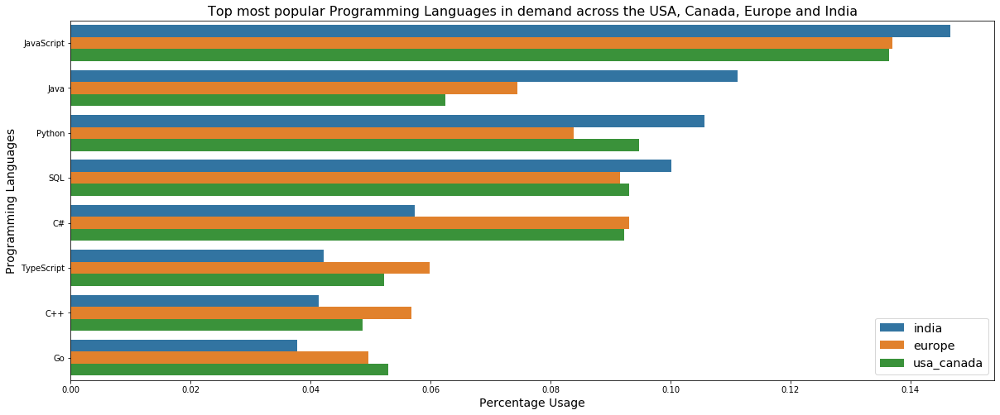

In [22]:
plt.figure(figsize=(20,8))
sns.barplot(x = 'Percentage', 
            y = 'Language',
            hue = 'region',
            data = demand_lang_chart.sort_values(by='Percentage', ascending=False))

plt.title('Top most popular Programming Languages in demand across the USA, Canada, Europe and India', size = 16)
plt.xlabel("Percentage Usage", fontsize = 14)
plt.ylabel("Programming Languages", fontsize = 14)
plt.legend(fontsize='x-large', title_fontsize='40')
plt.show()